In [277]:
suppressPackageStartupMessages({
  library(Seurat)
  library(dplyr)
  library(ggplot2)
  library(scCustomize)
  library(scater)
    library(RColorBrewer)
    library(data.table)
    library(stringr)
library(tibble)
    library(tidyr)
    library(scDblFinder)
    library(scCustomize)
})

In [278]:
fig.size <- function (height, width, res=300) {
    options(repr.plot.height = height, repr.plot.width = width, resolution=res)
}

In [3]:
homo = readRDS(
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_homo.rds'
        )
)

In [4]:
hemi = readRDS(
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_hemi.rds'
        )
)

In [60]:
tumor.int = readRDS('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/data/dong_et_al/6_sample_tumor_int.rds')

In [61]:
tumor.int@meta.data %>% head

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,scDblFinder.class,scDblFinder.score,integrated_snn_res.0.2,integrated_snn_res.0.4,integrated_snn_res.0.5,integrated_snn_res.0.6,seurat_clusters
,<chr>,<dbl>,<int>,<dbl>,<chr>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>
AAACCCAAGATCCAAA.1_1,T162,1902,993,7.3080967,singlet,0.0017687298,0,0,0,1,1
AAACCCAAGCACAAAT.1_1,T162,2425,1083,4.2061856,singlet,0.1785652936,0,0,0,1,1
AAACCCAAGCACTTTG.1_1,T162,4447,1828,5.0371037,singlet,0.1838824600,1,2,2,2,2
AAACCCAAGGCAGGGA.1_1,T162,1402,818,2.1398003,singlet,0.0006778225,0,1,1,0,0
AAACCCACAACCCTCT.1_1,T162,2145,1122,6.1072261,singlet,0.0008202924,1,2,2,2,2
AAACCCACAAGCCATT.1_1,T162,3139,1564,0.9875757,singlet,0.0658901930,6,7,8,9,9


In [214]:
unique(tumor.int$orig.ident)

[1] "T162" "T200" "T230" "NB16" "NB21" "NB22"

In [62]:
six_annot = openxlsx::read.xlsx('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/spread_sheet/6_samples_dong_integration_annotations.xlsx')

In [63]:
six_annot$Annotation[ tumor.int$`integrated_snn_res.0.5` ] %>% head

[1] "Adrenergic" "Adrenergic" "Adrenergic" "Adrenergic" "Adrenergic"
[6] "Adrenergic"

In [64]:
tumor.int@meta.data$annot = as.factor( six_annot$Annotation[ tumor.int$`integrated_snn_res.0.5` ])

In [65]:
Idents(tumor.int) = "annot"

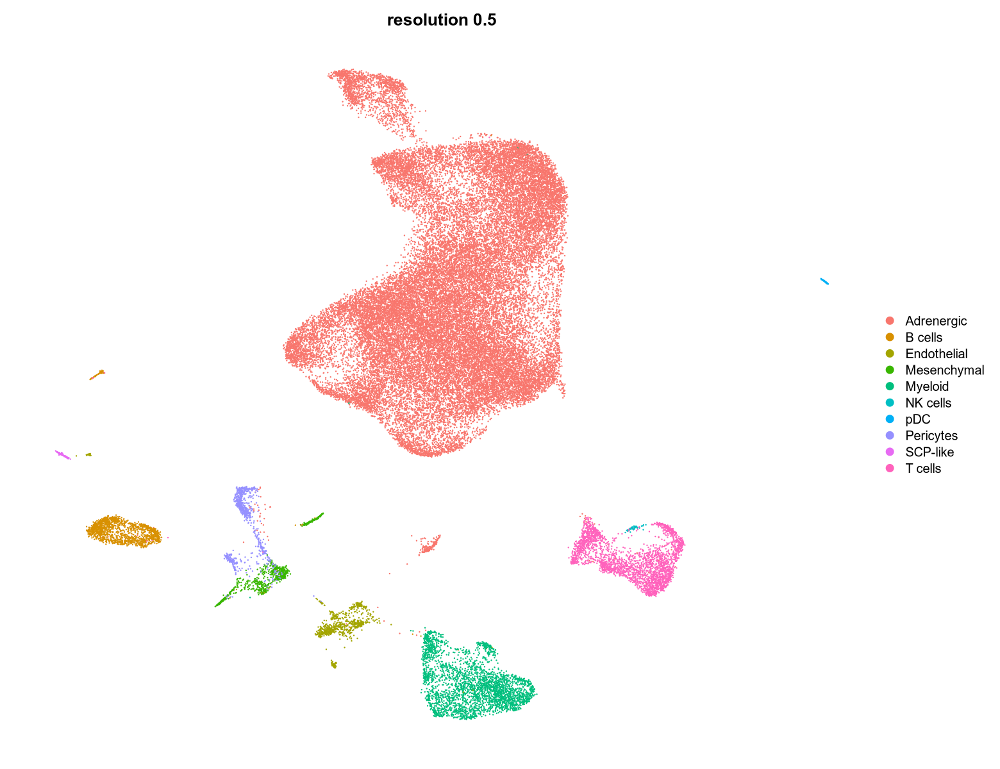

In [66]:
fig.size(10,13)
p.hs = DimPlot(tumor.int, label = F, reduction = "umap", 
               group.by = "annot")+labs(title="resolution 0.5") + NoAxes()
p.hs

In [67]:

annotation.hs.df = openxlsx::read.xlsx(
    '../Figure3A_20230629_6_samples_dong_integration_annotations.xlsx')

In [68]:
annot = annotation.hs.df$Annotation

In [69]:
tumor.int$annot = annot[ tumor.int@meta.data$`integrated_snn_res.0.5` ]

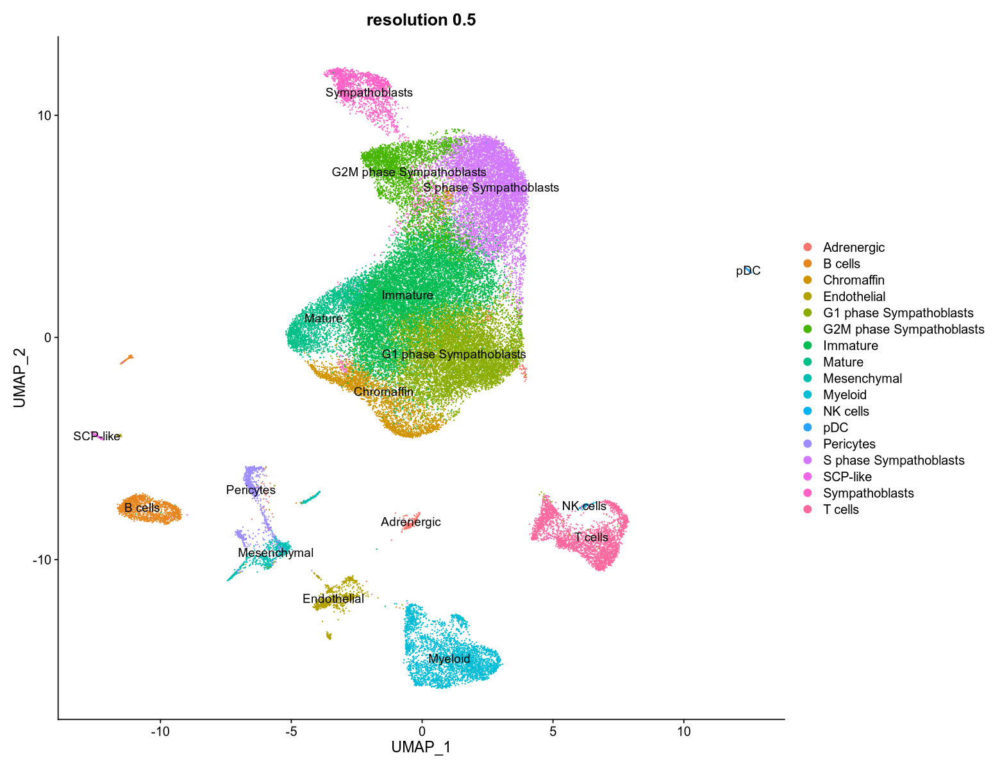

In [70]:
fig.size(10,13)
DimPlot(tumor.int, label = T, reduction = "umap", 
               group.by = "annot")+labs(title="resolution 0.5")

In [71]:
Idents(tumor.int) = "annot"

In [73]:
tumor.int

An object of class Seurat 
36330 features across 50330 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 2 layers present: data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [72]:
subset(tumor.int, idents =  c('Adrenergic'), invert = TRUE)

An object of class Seurat 
36330 features across 50049 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 2 layers present: data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [74]:
tumor.int = subset(tumor.int, idents =  c('Adrenergic'), invert = TRUE)

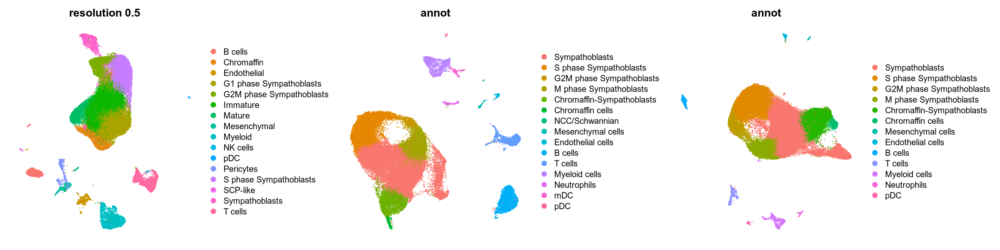

In [75]:
fig.size(5,20)
p.hs = DimPlot(tumor.int, label = F, reduction = "umap", 
               group.by = "annot")+labs(title="resolution 0.5") + NoAxes()
p.homo = DimPlot(homo, label=F, reduction="umap", group.by="annot") + NoAxes()
p.hemi = DimPlot(hemi, label=F, reduction="umap", group.by="annot") + NoAxes()
p.hs | p.homo | p.hemi

In [76]:
hemi.annot = openxlsx::read.xlsx('20240814_Annotations_5-Hemizygous_Samples.xlsx')
annot = hemi.annot$Annotation
hemi@meta.data$annot.new = annot[ hemi$seurat_clusters ]
Idents(hemi) = "annot.new"

In [77]:
homo.annot = openxlsx::read.xlsx('20240814_Annotations_5-Homozygous_Samples.xlsx')
annot = homo.annot$Annotation
homo@meta.data$annot.new = annot[ homo$seurat_clusters ]
Idents(homo) = "annot.new"

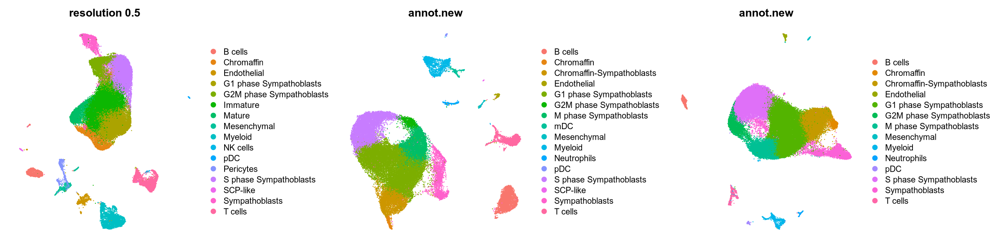

In [78]:
fig.size(5,20)
p.hs = DimPlot(tumor.int, label = F, reduction = "umap", 
               group.by = "annot")+labs(title="resolution 0.5") + NoAxes()
p.homo = DimPlot(homo, label=F, reduction="umap", group.by="annot.new") + NoAxes()
p.hemi = DimPlot(hemi, label=F, reduction="umap", group.by="annot.new") + NoAxes()
p.hs | p.homo | p.hemi

In [79]:
unique(tumor.int$annot)

[1] "Immature"                 "S phase Sympathoblasts"  
 [3] "G1 phase Sympathoblasts"  "Sympathoblasts"          
 [5] "Myeloid"                  "G2M phase Sympathoblasts"
 [7] "T cells"                  "Mature"                  
 [9] "B cells"                  "Chromaffin"              
[11] "Mesenchymal"              "pDC"                     
[13] "Pericytes"                "Endothelial"             
[15] "SCP-like"                 "NK cells"

In [80]:
unique(homo$annot.new)

[1] "T cells"                   "Chromaffin-Sympathoblasts"
 [3] "Endothelial"               "G1 phase Sympathoblasts"  
 [5] "S phase Sympathoblasts"    "M phase Sympathoblasts"   
 [7] "B cells"                   "mDC"                      
 [9] "Myeloid"                   "G2M phase Sympathoblasts" 
[11] "Chromaffin"                "Mesenchymal"              
[13] "Sympathoblasts"            "SCP-like"                 
[15] "Neutrophils"               "pDC"

In [81]:
unique(hemi$annot.new)

[1] "S phase Sympathoblasts"    "G1 phase Sympathoblasts"  
 [3] "Endothelial"               "M phase Sympathoblasts"   
 [5] "Chromaffin-Sympathoblasts" "Sympathoblasts"           
 [7] "G2M phase Sympathoblasts"  "Myeloid"                  
 [9] "Mesenchymal"               "B cells"                  
[11] "T cells"                   "Neutrophils"              
[13] "Chromaffin"                "pDC"

In [82]:
all_cell_types = union(union(
   unique(tumor.int$annot),
   unique(homo$annot.new)
    ),
   unique(hemi$annot.new)
)

In [83]:
all_cell_types

[1] "Immature"                  "S phase Sympathoblasts"   
 [3] "G1 phase Sympathoblasts"   "Sympathoblasts"           
 [5] "Myeloid"                   "G2M phase Sympathoblasts" 
 [7] "T cells"                   "Mature"                   
 [9] "B cells"                   "Chromaffin"               
[11] "Mesenchymal"               "pDC"                      
[13] "Pericytes"                 "Endothelial"              
[15] "SCP-like"                  "NK cells"                 
[17] "Chromaffin-Sympathoblasts" "M phase Sympathoblasts"   
[19] "mDC"                       "Neutrophils"

In [84]:
length(all_cell_types)

[1] 20

In [85]:
#color.list = scales::hue_pal()(21)
color.list = ggthemes::tableau_color_pal('Tableau 20')(20)
#color.list = hue_pal()(15)
names(color.list) = all_cell_types

In [86]:
color.list

Immature    S phase Sympathoblasts   G1 phase Sympathoblasts 
                "#4E79A7"                 "#A0CBE8"                 "#F28E2B" 
           Sympathoblasts                   Myeloid  G2M phase Sympathoblasts 
                "#FFBE7D"                 "#59A14F"                 "#8CD17D" 
                  T cells                    Mature                   B cells 
                "#B6992D"                 "#F1CE63"                 "#499894" 
               Chromaffin               Mesenchymal                       pDC 
                "#86BCB6"                 "#E15759"                 "#FF9D9A" 
                Pericytes               Endothelial                  SCP-like 
                "#79706E"                 "#BAB0AC"                 "#D37295" 
                 NK cells Chromaffin-Sympathoblasts    M phase Sympathoblasts 
                "#FABFD2"                 "#B07AA1"                 "#D4A6C8" 
                      mDC               Neutrophils 
                "#9D7660"                 "#D7B5A6"

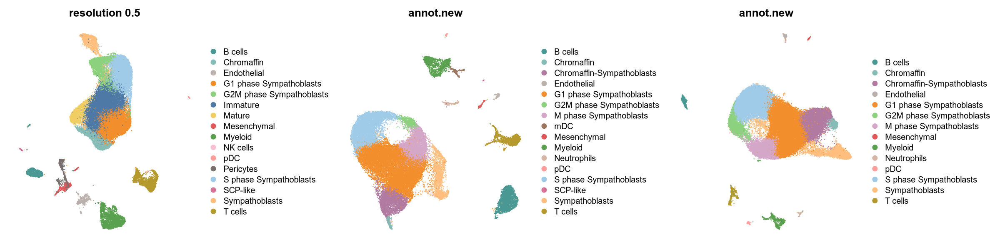

In [87]:
fig.size(5,20)
p.hs = DimPlot(tumor.int, label = F, reduction = "umap", 
               group.by = "annot")+labs(title="resolution 0.5") +scale_color_manual(values = color.list) + NoAxes()
p.homo = DimPlot(homo, label=F, reduction="umap", group.by="annot.new")+scale_color_manual(values = color.list) + NoAxes()
p.hemi = DimPlot(hemi, label=F, reduction="umap", group.by="annot.new")+scale_color_manual(values = color.list) + NoAxes()
p.hs | p.homo | p.hemi

In [88]:
p.hs = DimPlot(tumor.int, label = F, reduction = "umap", 
               group.by = "annot") + 
        labs(title = "resolution 0.5") +
        scale_color_manual(values = color.list) +
        NoAxes()

p.homo = DimPlot(homo, label = F, reduction = "umap", 
                 group.by = "annot.new") + 
          scale_color_manual(values = color.list) +
          NoAxes() +
          theme(legend.position = "none")  # Hide the legend

p.hemi = DimPlot(hemi, label = F, reduction = "umap", 
                 group.by = "annot.new") + 
          scale_color_manual(values = color.list) +
          NoAxes() +
          theme(legend.position = "none")  # Hide the legend

# Combine the plots and keep only the legend from the first plot
combined_plot <- p.hs | p.homo | p.hemi & theme(legend.position = "right")

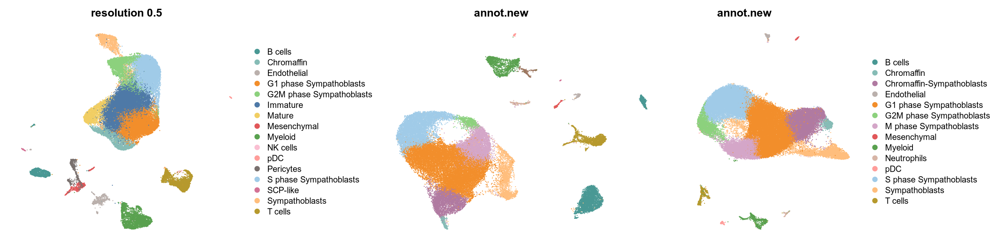

In [89]:
combined_plot

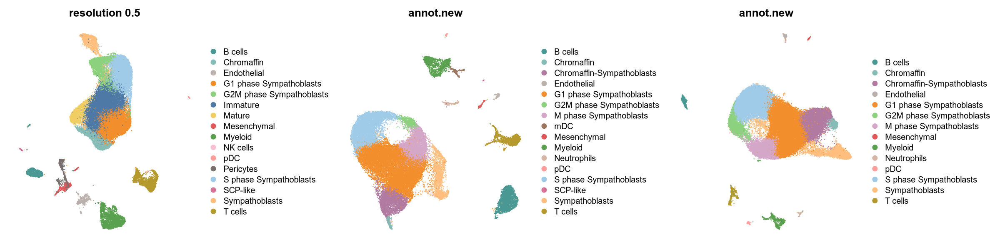

In [92]:
fig.size(5,20)
p.hs = DimPlot(tumor.int, label = F, reduction = "umap", 
               group.by = "annot")+labs(title="resolution 0.5") +scale_color_manual(values = color.list) + NoAxes()
p.homo = DimPlot(homo, label=F, reduction="umap", group.by="annot.new")+scale_color_manual(values = color.list) + NoAxes()
p.hemi = DimPlot(hemi, label=F, reduction="umap", group.by="annot.new")+scale_color_manual(values = color.list) + NoAxes()
combined_plots = p.hs | p.homo | p.hemi
combined_plots

In [93]:
fig.size(5,20)
p.hs = DimPlot(tumor.int, label = F, reduction = "umap", 
               group.by = "annot")+labs(title="resolution 0.5") +scale_color_manual(values = color.list) + NoAxes()
p.homo = DimPlot(homo, label=F, reduction="umap", group.by="annot.new")+scale_color_manual(values = color.list) + NoAxes()
p.hemi = DimPlot(hemi, label=F, reduction="umap", group.by="annot.new")+scale_color_manual(values = color.list) + NoAxes()
comined_plots = p.hs | p.homo | p.hemi

In [94]:

ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_3/Figure_3A_human_mouse_umap_separate.pdf'),
    plot= combined_plot, 
    height = 5,
    width = 20,
    create.dir=TRUE
      )

In [153]:
sig_df = openxlsx::read.xlsx('Pathways Signatures.xlsx')

In [121]:
sig_df <- sig_df %>% mutate_all(~str_to_title(.))

In [156]:
sig_df = sig_df[c('MYCN', 'MAPK')]

In [122]:
sig_list <- lapply(sig_df, function(x) x[!is.na(x)]) 

In [123]:
names(sig_list) <- colnames(sig_df)

In [128]:
homo <- AddModuleScore(homo, features = sig_list, name = names(sig_list))

Warning message:
“The following features are not present in the object: C19orf43, C1orf114, C20orf72, C7orf60, Cyp4v2, Diras3, Eif2c4, Fam134b, Fam82a2, Fam85a, Hmp19, Kiaa0226, Kiaa0895, Kif4a, Loc442075, Tp53inp1, Znf25, Znf317, Znf608, Linc00467, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Hspa6, Faslg, Ntf4, Pla2g2a, Prkacg, Tp53, Jmjd7-Pla2g4b, Fgf19, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Alox15b, H2aj, H1-2, H2ac25, Ifi30, Elp1, Irag2, Tp53, Tp63, Znf365, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Cxcl11, Cxcl6, Icoslg, Il4r, Cxcl8, not searching for symbol synonyms”


In [134]:
rownames(homo)[grepl("Trp*",rownames(homo))]

[1] "Tram1"            "Trpa1"            "Tram2"           
  [4] "Trak2"            "Trip12"           "Trpm8"           
  [7] "Traf3ip1"         "Trove2"           "Trmt1l"          
 [10] "Trp53bp2"         "Traf5"            "Traf3ip3"        
 [13] "Trdmt1"           "Traf2"            "Trub2"           
 [16] "Traf1"            "Trp53i11"         "Traf6"           
 [19] "Trim44"           "Trp53bp1"         "Trim69"          
 [22] "Trpm7"            "Trmt6"            "Trib3"           
 [25] "Trp53inp2"        "Trpc4ap"          "Trp53tg5"        
 [28] "Trp53rka"         "Trp53rkb"         "Trex2"           
 [31] "Trmt2b"           "Trap1a"           "Trpc5"           
 [34] "Trpc5os"          "Tro"              "Trappc2"         
 [37] "Trim55"           "Trpc3"            "Trpc4"           
 [40] "Trim59"           "Trim2"            "Trim46"          
 [43] "Trim45"           "Trim33"           "Trmt13"          
 [46] "Tram1l1"          "Trmt10a"          "Trp53inp1"       
 [49] "Triqk"            "Trmt10b"          "Trmo"            
 [52] "Trim14"           "Trim32"           "Trabd2b"         
 [55] "Trit1"            "Trappc3"          "Trim62"          
 [58] "Trnau1ap"         "Trnp1"            "Trim63"          
 [61] "Trp73"            "Trp73os"          "Trim54"          
 [64] "Trmt44"           "Trpv4"            "Triap1"          
 [67] "Trafd1"           "Trim50"           "Trim56"          
 [70] "Trip6"            "Trrap"            "Trim24"          
 [73] "Trbv1"            "Trbv2"            "Trbv3"           
 [76] "Trbv4"            "Trbv5"            "Trbv6"           
 [79] "Trbv7"            "Trbv8"            "Trbv9"           
 [82] "Trbv10"           "Trbv11"           "Trbv12-1"        
 [85] "Trbv13-1"         "Trbv12-2"         "Trbv13-2"        
 [88] "Trbv12-3"         "Trbv13-3"         "Trbv14"          
 [91] "Trbv15"           "Trbv16"           "Trbv17"          
 [94] "Trbv18"           "Trbv19"           "Trbv20"          
 [97] "Trbv21"           "Trbv22"           "Trbv23"          
[100] "Trbv24"           "Trbv25"           "Trbv26"          
[103] "Trbv27"           "Trbv28"           "Trbv29"          
[106] "Trbv30"           "Try4"             "Try5"            
[109] "Try10"            "Trbd1"            "Trbj1-1"         
[112] "Trbj1-2"          "Trbj1-3"          "Trbj1-4"         
[115] "Trbj1-5"          "Trbj1-6"          "Trbj1-7"         
[118] "Trbc1"            "Trbd2"            "Trbj2-1"         
[121] "Trbj2-2"          "Trbj2-3"          "Trbj2-4"         
[124] "Trbj2-5"          "Trbj2-6"          "Trbj2-7"         
[127] "Trbc2"            "Trbv31"           "Trpv6"           
[130] "Trpv5"            "Tra2a"            "Tril"            
[133] "Trh"              "Trnt1"            "Trim28"          
[136] "Trappc6a"         "Trpm4"            "Trpm1"           
[139] "Trpc2"            "Trim21"           "Trim68"          
[142] "Trim6"            "Trim34a"          "Trim5"           
[145] "Trim12a"          "Trim34b"          "Trim12c"         
[148] "Trim30b"          "Trim30c"          "Trim30a"         
[151] "Trim30d"          "Trim3"            "Trim66"          
[154] "Trim72"           "Trpm5"            "Trmt11"          
[157] "Trdn"             "Trappc3l"         "Traf3ip2"        
[160] "Trpm2"            "Trappc10"         "Trhde"           
[163] "Trappc5"          "Triml1"           "Triml2"          
[166] "Trappc11"         "Trim75"           "Trim60"          
[169] "Trim61"           "Trmt1"            "Trir"            
[172] "Tradd"            "Trhr2"            "Trappc2l"        
[175] "Trim67"           "Trav1"            "Trav2"           
[178] "Trav3-1"          "Trav4-1"          "Trav5-1"         
[181] "Trav6-1"          "Trav7-1"          "Trav6-2"         
[184] "Trav7d-2"         "Trav4d-2"         "Trav6d-3"        
[187] "Trav7d-3"         "Trav6d-4"         "Trav7d-4"        
[190] "Trav8d-1"         "Trav9d-

## Human

In [157]:
pathways_of_interest = c(
    'HALLMARK_DNA_REPAIR','HALLMARK_E2F_TARGETS',
    'HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION','HALLMARK_HEDGEHOG_SIGNALING','HALLMARK_WNT_BETA_CATENIN_SIGNALING',
    'HALLMARK_INFLAMMATORY_RESPONSE',
    'HALLMARK_KRAS_SIGNALING_DN',
    'HALLMARK_KRAS_SIGNALING_UP',
    'HALLMARK_MYC_TARGETS_V1',
    'HALLMARK_MYC_TARGETS_V2',
    'HALLMARK_NOTCH_SIGNALING',
    'HALLMARK_P53_PATHWAY',
    'HALLMARK_PI3K_AKT_MTOR_SIGNALING',
    'HALLMARK_TGF_BETA_SIGNALING',
    'HALLMARK_TNFA_SIGNALING_VIA_NFKB',
    'HALLMARK_WNT_BETA_CATENIN_SIGNALING'
)

In [158]:
inpGS <- data.table(msigdbr(species = "human", category = "H"))

In [159]:
sig_df = sig_df[c('MYCN', 'MAPK')]
sig_list <- lapply(sig_df, function(x) x[!is.na(x)])
names(sig_list) <- colnames(sig_df)
inpGS <- inpGS %>% filter(gs_name %in% pathways_of_interest)

In [161]:
inpGS <- split(inpGS$gene_symbol, inpGS$gs_name)

In [166]:
DefaultAssay(tumor.int) = "RNA"

In [167]:
tumor.int <- AddModuleScore(tumor.int, features = inpGS, name = names(inpGS))
tumor.int <- AddModuleScore(tumor.int, features = sig_list, name = names(sig_list))

Warning message:
“The following features are not present in the object: POLR1H, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: H2AX, H2AZ1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: CCN1, CCN2, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: MACROH2A2, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: H2BC3, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: EPRS1, H2AZ1, IARS1, KARS1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: H1-2, H2AJ, H2AW, IRAG2, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: CCN1, not searching for symbol synonyms”
Warning message:
“The following fe

In [170]:
tumor.int@meta.data %>% ncol

[1] 29

In [183]:
tumor.int@meta.data[12:29] %>% head

,annot,HALLMARK_DNA_REPAIR1,HALLMARK_E2F_TARGETS2,HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION3,HALLMARK_HEDGEHOG_SIGNALING4,HALLMARK_INFLAMMATORY_RESPONSE5,HALLMARK_KRAS_SIGNALING_DN6,HALLMARK_KRAS_SIGNALING_UP7,HALLMARK_MYC_TARGETS_V18,HALLMARK_MYC_TARGETS_V29,HALLMARK_NOTCH_SIGNALING10,HALLMARK_P53_PATHWAY11,HALLMARK_PI3K_AKT_MTOR_SIGNALING12,HALLMARK_TGF_BETA_SIGNALING13,HALLMARK_TNFA_SIGNALING_VIA_NFKB14,HALLMARK_WNT_BETA_CATENIN_SIGNALING15,MYCN1,MAPK2
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCAAGATCCAAA.1_1,Immature,0.078627547,0.0251493551,-0.03339300,-0.005177286,-0.04936766,-0.02527456,0.017415166,0.2639538,0.08326525,0.06383489,0.036513361,-0.007426689,-0.048459993,-0.05491517,-0.06343272,0.014563678,-0.013320296
AAACCCAAGCACAAAT.1_1,Immature,-0.003219132,0.0006993883,-0.07580879,0.258207852,-0.06350993,-0.01737336,-0.002798885,0.4190668,-0.01562554,0.06673352,0.010687733,0.036843601,-0.009797092,-0.07867645,0.03151314,-0.003544175,-0.021459814
AAACCCAAGCACTTTG.1_1,S phase Sympathoblasts,0.163071344,0.2629472536,-0.03967366,-0.086681447,-0.05869118,-0.01348639,-0.059768720,0.6920614,0.12939617,0.17528153,0.068898471,0.112076788,0.007965255,-0.06501811,-0.02288577,0.000107674,-0.001703800
AAACCCAAGGCAGGGA.1_1,G1 phase Sympathoblasts,-0.031903416,0.0168691109,-0.06225676,-0.011076249,-0.05899279,-0.03290907,-0.014607191,0.3178294,-0.02454646,0.06110033,-0.001834068,-0.011707606,-0.156903564,-0.02491742,-0.04533457,0.019533870,-0.001065957
AAACCCACAACCCTCT.1_1,S phase Sympathoblasts,0.072835597,0.1917710024,-0.02339097,0.037793201,-0.03264584,-0.00522286,-0.024735353,0.5546233,-0.08151896,0.03024955,0.058695696,0.011562654,-0.101760022,-0.01220696,-0.03186773,0.013976898,-0.010150956
AAACCCACAAGCCATT.1_1,Sympathoblasts,0.088466715,0.4321261332,-0.06338072,0.023837006,-0.02816556,-0.01845045,-0.037148998,0.7580695,0.14021392,0.02411765,-0.028427635,0.061195994,-0.023535888,0.01545560,0.01831500,-0.003813786,-0.011027869


In [184]:
sig_colnames = colnames(tumor.int@meta.data)[13:29]

In [189]:
fig.size(20, 20)
featplot = FeaturePlot(tumor.int, reduction = "umap", pt.size = 0.1,
                  features = sig_colnames, order = TRUE) &
  scale_color_distiller(palette = "RdYlBu") & plotTheme & coord_fixed()

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is

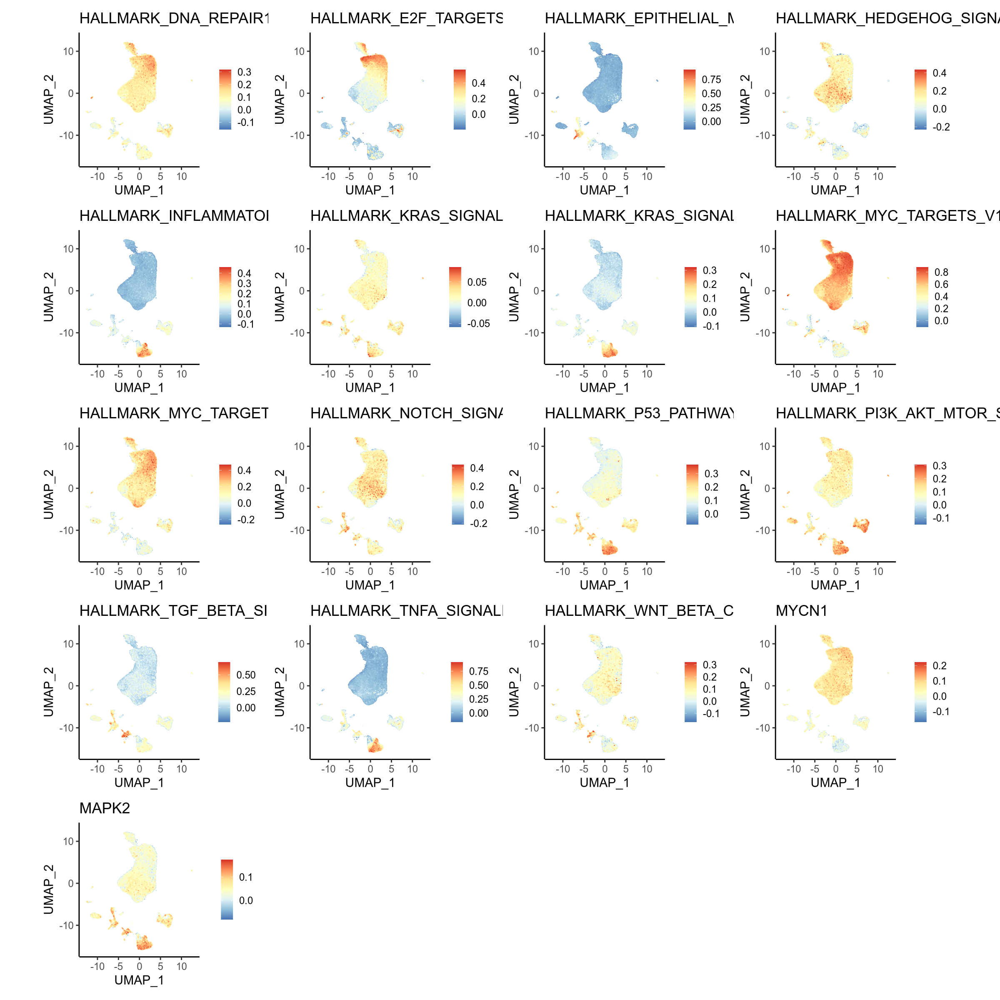

In [187]:
feat_plot

In [190]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_3/Figure_R2D_hallmark_signature_human_tumor.pdf'),
    plot =featplot, 
    height = 20,
    width = 20,
    create.dir=TRUE
      )


### Homo

In [191]:
inpGS <- data.table(msigdbr(species = "mouse", category = "H"))

In [192]:
sig_df = sig_df[c('MYCN', 'MAPK')] %>% mutate_all(~str_to_title(.))
sig_list <- lapply(sig_df, function(x) x[!is.na(x)])
names(sig_list) <- colnames(sig_df)
inpGS <- inpGS %>% filter(gs_name %in% pathways_of_interest)

In [193]:
inpGS <- split(inpGS$gene_symbol, inpGS$gs_name)

In [194]:
DefaultAssay(homo) = "RNA"

In [195]:
homo <- AddModuleScore(homo, features = inpGS, name = names(inpGS))
homo <- AddModuleScore(homo, features = sig_list, name = names(sig_list))

Warning message:
“The following features are not present in the object: Polr1h, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Ddx39a, H2ax, H2az1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Ccn1, Ccn2, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Cxcl11, Slc28a2b, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Macroh2a2, Mx2, Myo15a, Prkn, Tent5c, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Ero1a, H2bc3, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: H2az1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Skp1, not searching for symbol synonyms”
Warning message:
“Th

In [200]:
colnames(homo@meta.data)[18:36]

[1] "MYCN1"                                      
 [2] "MAPK2"                                      
 [3] "P533"                                       
 [4] "Inflammatory.Response4"                     
 [5] "HALLMARK_DNA_REPAIR1"                       
 [6] "HALLMARK_E2F_TARGETS2"                      
 [7] "HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION3"
 [8] "HALLMARK_HEDGEHOG_SIGNALING4"               
 [9] "HALLMARK_INFLAMMATORY_RESPONSE5"            
[10] "HALLMARK_KRAS_SIGNALING_DN6"                
[11] "HALLMARK_KRAS_SIGNALING_UP7"                
[12] "HALLMARK_MYC_TARGETS_V18"                   
[13] "HALLMARK_MYC_TARGETS_V29"                   
[14] "HALLMARK_NOTCH_SIGNALING10"                 
[15] "HALLMARK_P53_PATHWAY11"                     
[16] "HALLMARK_PI3K_AKT_MTOR_SIGNALING12"         
[17] "HALLMARK_TGF_BETA_SIGNALING13"              
[18] "HALLMARK_TNFA_SIGNALING_VIA_NFKB14"         
[19] "HALLMARK_WNT_BETA_CATENIN_SIGNALING15"

In [197]:
length(colnames(homo@meta.data) )

[1] 36

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is

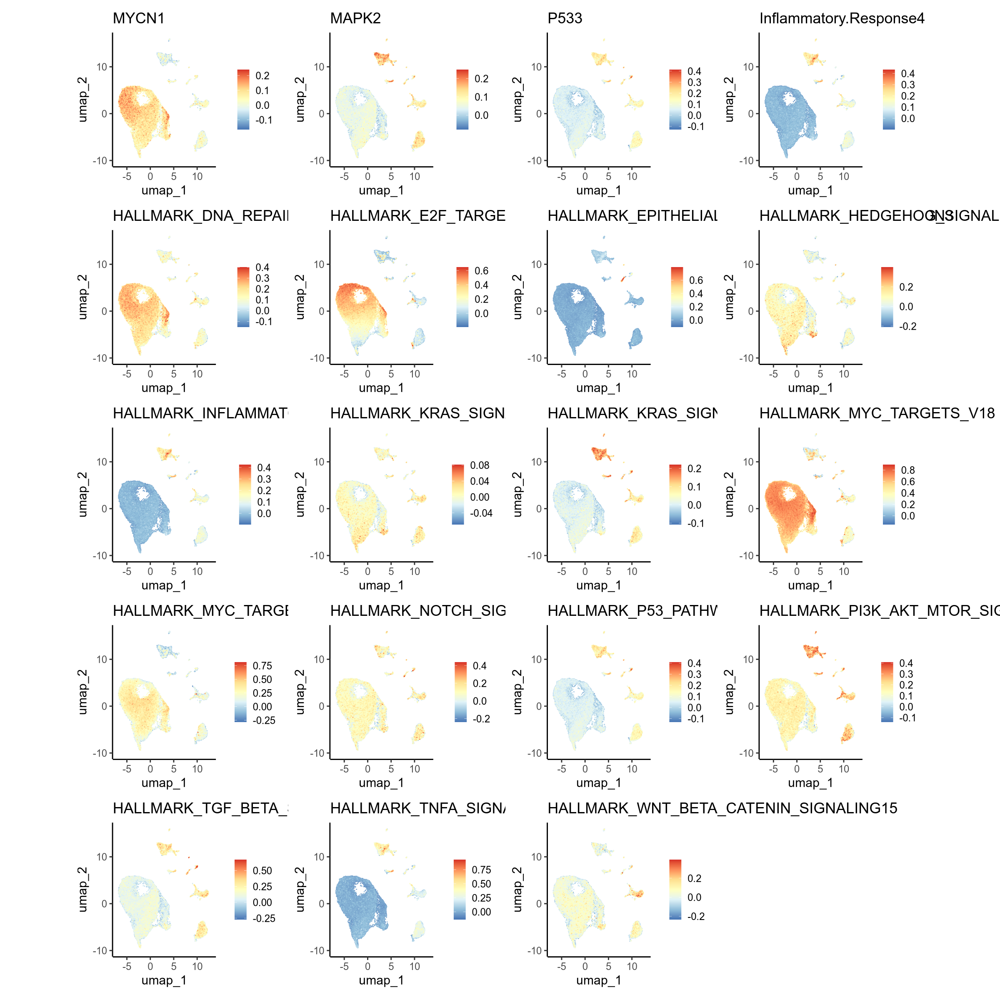

In [201]:
fig.size(20, 20)
featplot = FeaturePlot(homo, reduction = "umap", pt.size = 0.1,
                  features = colnames(homo@meta.data)[18:36], order = TRUE) &
  scale_color_distiller(palette = "RdYlBu") & plotTheme & coord_fixed()
featplot

In [202]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_3/Figure_R2D_hallmark_signature_homo.pdf'),
    plot =featplot, 
    height = 20,
    width = 20,
    create.dir=TRUE
      )


In [203]:
hemi <- AddModuleScore(hemi, features = inpGS, name = names(inpGS))
hemi <- AddModuleScore(hemi, features = sig_list, name = names(sig_list))

Warning message:
“The following features are not present in the object: Polr1h, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Ddx39a, H2ax, H2az1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Ccn1, Ccn2, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Cxcl11, Slc28a2b, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Macroh2a2, Mx2, Myo15a, Prkn, Tent5c, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Ero1a, H2bc3, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: H2az1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Skp1, not searching for symbol synonyms”
Warning message:
“Th

In [211]:
colnames(hemi@meta.data)[16:32]

[1] "HALLMARK_DNA_REPAIR1"                       
 [2] "HALLMARK_E2F_TARGETS2"                      
 [3] "HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION3"
 [4] "HALLMARK_HEDGEHOG_SIGNALING4"               
 [5] "HALLMARK_INFLAMMATORY_RESPONSE5"            
 [6] "HALLMARK_KRAS_SIGNALING_DN6"                
 [7] "HALLMARK_KRAS_SIGNALING_UP7"                
 [8] "HALLMARK_MYC_TARGETS_V18"                   
 [9] "HALLMARK_MYC_TARGETS_V29"                   
[10] "HALLMARK_NOTCH_SIGNALING10"                 
[11] "HALLMARK_P53_PATHWAY11"                     
[12] "HALLMARK_PI3K_AKT_MTOR_SIGNALING12"         
[13] "HALLMARK_TGF_BETA_SIGNALING13"              
[14] "HALLMARK_TNFA_SIGNALING_VIA_NFKB14"         
[15] "HALLMARK_WNT_BETA_CATENIN_SIGNALING15"      
[16] "MYCN1"                                      
[17] "MAPK2"

In [205]:
colnames(hemi@meta.data) %>% length

[1] 32

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is

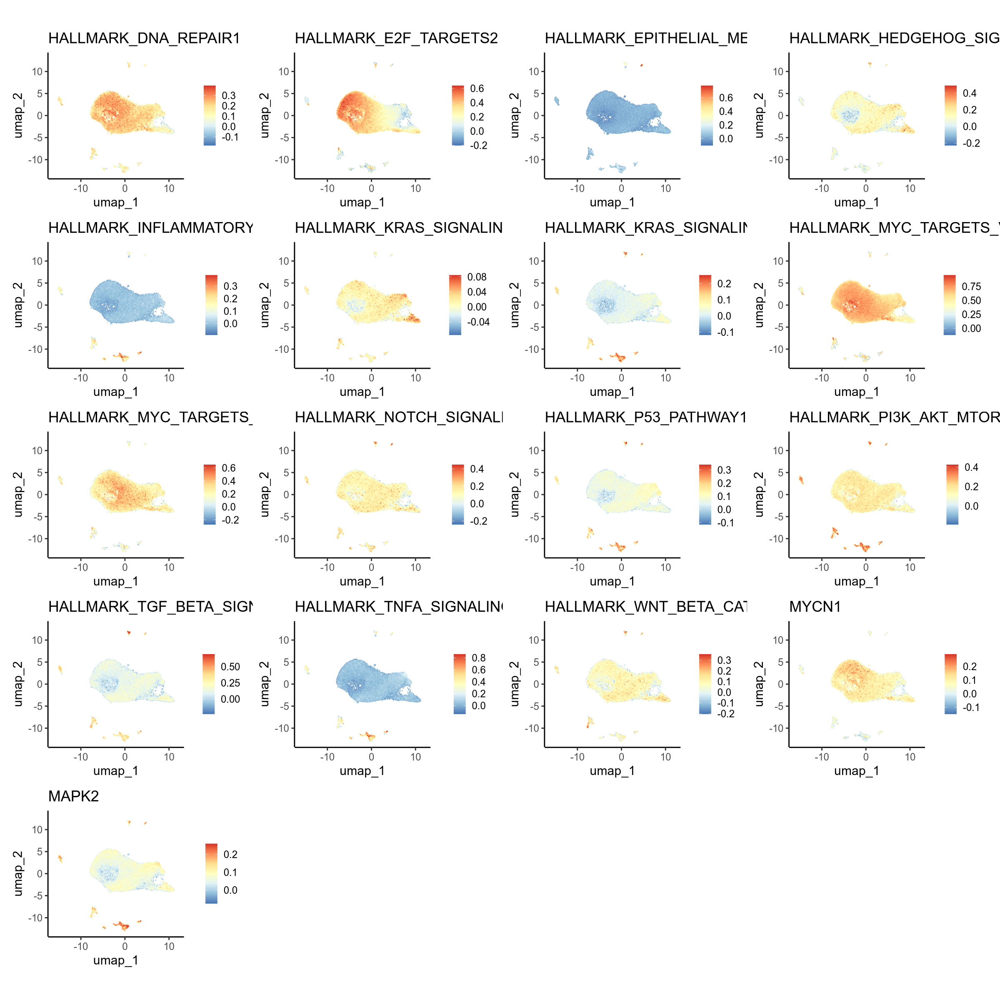

In [212]:
fig.size(20, 20)
featplot = FeaturePlot(hemi, reduction = "umap", pt.size = 0.1,
                  features = colnames(hemi@meta.data)[16:32], order = TRUE) &
  scale_color_distiller(palette = "RdYlBu") & plotTheme & coord_fixed()
featplot

In [213]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_3/Figure_R2D_hallmark_signature_hemi.pdf'),
    plot =featplot, 
    height = 20,
    width = 20,
    create.dir=TRUE
      )


In [96]:
suppressPackageStartupMessages({
    library(msigdbr)
    library(DOSE)
    library(dplyr)
    #library(ReactomePA)'
    library(ggplot2)
    library(clusterProfiler)
    library(ComplexHeatmap)
    library(circlize)
})

In [136]:
inpGS <- data.table(msigdbr(species = "mouse", category = "H"))

In [138]:
inpGS %>% pull(gs_name) %>% unique

[1] "HALLMARK_ADIPOGENESIS"                     
 [2] "HALLMARK_ALLOGRAFT_REJECTION"              
 [3] "HALLMARK_ANDROGEN_RESPONSE"                
 [4] "HALLMARK_ANGIOGENESIS"                     
 [5] "HALLMARK_APICAL_JUNCTION"                  
 [6] "HALLMARK_APICAL_SURFACE"                   
 [7] "HALLMARK_APOPTOSIS"                        
 [8] "HALLMARK_BILE_ACID_METABOLISM"             
 [9] "HALLMARK_CHOLESTEROL_HOMEOSTASIS"          
[10] "HALLMARK_COAGULATION"                      
[11] "HALLMARK_COMPLEMENT"                       
[12] "HALLMARK_DNA_REPAIR"                       
[13] "HALLMARK_E2F_TARGETS"                      
[14] "HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION"
[15] "HALLMARK_ESTROGEN_RESPONSE_EARLY"          
[16] "HALLMARK_ESTROGEN_RESPONSE_LATE"           
[17] "HALLMARK_FATTY_ACID_METABOLISM"            
[18] "HALLMARK_G2M_CHECKPOINT"                   
[19] "HALLMARK_GLYCOLYSIS"                       
[20] "HALLMARK_HEDGEHOG_SIGNALING"               
[21] "HALLMARK_HEME_METABOLISM"                  
[22] "HALLMARK_HYPOXIA"                          
[23] "HALLMARK_IL2_STAT5_SIGNALING"              
[24] "HALLMARK_IL6_JAK_STAT3_SIGNALING"          
[25] "HALLMARK_INFLAMMATORY_RESPONSE"            
[26] "HALLMARK_INTERFERON_ALPHA_RESPONSE"        
[27] "HALLMARK_INTERFERON_GAMMA_RESPONSE"        
[28] "HALLMARK_KRAS_SIGNALING_DN"                
[29] "HALLMARK_KRAS_SIGNALING_UP"                
[30] "HALLMARK_MITOTIC_SPINDLE"                  
[31] "HALLMARK_MTORC1_SIGNALING"                 
[32] "HALLMARK_MYC_TARGETS_V1"                   
[33] "HALLMARK_MYC_TARGETS_V2"                   
[34] "HALLMARK_MYOGENESIS"                       
[35] "HALLMARK_NOTCH_SIGNALING"                  
[36] "HALLMARK_OXIDATIVE_PHOSPHORYLATION"        
[37] "HALLMARK_P53_PATHWAY"                      
[38] "HALLMARK_PANCREAS_BETA_CELLS"              
[39] "HALLMARK_PEROXISOME"                       
[40] "HALLMARK_PI3K_AKT_MTOR_SIGNALING"          
[41] "HALLMARK_PROTEIN_SECRETION"                
[42] "HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY"  
[43] "HALLMARK_SPERMATOGENESIS"                  
[44] "HALLMARK_TGF_BETA_SIGNALING"               
[45] "HALLMARK_TNFA_SIGNALING_VIA_NFKB"          
[46] "HALLMARK_UNFOLDED_PROTEIN_RESPONSE"        
[47] "HALLMARK_UV_RESPONSE_DN"                   
[48] "HALLMARK_UV_RESPONSE_UP"                   
[49] "HALLMARK_WNT_BETA_CATENIN_SIGNALING"       
[50] "HALLMARK_XENOBIOTIC_METABOLISM"

In [151]:
inpGSH <- data.table(msigdbr(species = "human", category = "H"))

In [152]:
inpGSH %>% pull(gs_name) %>% unique

[1] "HALLMARK_ADIPOGENESIS"                     
 [2] "HALLMARK_ALLOGRAFT_REJECTION"              
 [3] "HALLMARK_ANDROGEN_RESPONSE"                
 [4] "HALLMARK_ANGIOGENESIS"                     
 [5] "HALLMARK_APICAL_JUNCTION"                  
 [6] "HALLMARK_APICAL_SURFACE"                   
 [7] "HALLMARK_APOPTOSIS"                        
 [8] "HALLMARK_BILE_ACID_METABOLISM"             
 [9] "HALLMARK_CHOLESTEROL_HOMEOSTASIS"          
[10] "HALLMARK_COAGULATION"                      
[11] "HALLMARK_COMPLEMENT"                       
[12] "HALLMARK_DNA_REPAIR"                       
[13] "HALLMARK_E2F_TARGETS"                      
[14] "HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION"
[15] "HALLMARK_ESTROGEN_RESPONSE_EARLY"          
[16] "HALLMARK_ESTROGEN_RESPONSE_LATE"           
[17] "HALLMARK_FATTY_ACID_METABOLISM"            
[18] "HALLMARK_G2M_CHECKPOINT"                   
[19] "HALLMARK_GLYCOLYSIS"                       
[20] "HALLMARK_HEDGEHOG_SIGNALING"               
[21] "HALLMARK_HEME_METABOLISM"                  
[22] "HALLMARK_HYPOXIA"                          
[23] "HALLMARK_IL2_STAT5_SIGNALING"              
[24] "HALLMARK_IL6_JAK_STAT3_SIGNALING"          
[25] "HALLMARK_INFLAMMATORY_RESPONSE"            
[26] "HALLMARK_INTERFERON_ALPHA_RESPONSE"        
[27] "HALLMARK_INTERFERON_GAMMA_RESPONSE"        
[28] "HALLMARK_KRAS_SIGNALING_DN"                
[29] "HALLMARK_KRAS_SIGNALING_UP"                
[30] "HALLMARK_MITOTIC_SPINDLE"                  
[31] "HALLMARK_MTORC1_SIGNALING"                 
[32] "HALLMARK_MYC_TARGETS_V1"                   
[33] "HALLMARK_MYC_TARGETS_V2"                   
[34] "HALLMARK_MYOGENESIS"                       
[35] "HALLMARK_NOTCH_SIGNALING"                  
[36] "HALLMARK_OXIDATIVE_PHOSPHORYLATION"        
[37] "HALLMARK_P53_PATHWAY"                      
[38] "HALLMARK_PANCREAS_BETA_CELLS"              
[39] "HALLMARK_PEROXISOME"                       
[40] "HALLMARK_PI3K_AKT_MTOR_SIGNALING"          
[41] "HALLMARK_PROTEIN_SECRETION"                
[42] "HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY"  
[43] "HALLMARK_SPERMATOGENESIS"                  
[44] "HALLMARK_TGF_BETA_SIGNALING"               
[45] "HALLMARK_TNFA_SIGNALING_VIA_NFKB"          
[46] "HALLMARK_UNFOLDED_PROTEIN_RESPONSE"        
[47] "HALLMARK_UV_RESPONSE_DN"                   
[48] "HALLMARK_UV_RESPONSE_UP"                   
[49] "HALLMARK_WNT_BETA_CATENIN_SIGNALING"       
[50] "HALLMARK_XENOBIOTIC_METABOLISM"

In [145]:

plotTheme <- theme_classic(base_size = 18)

In [141]:
inpGS <- inpGS %>% filter(gs_name %in% pathways_of_interest)

In [142]:

inpGS$gs_name <- gsub("HALLMARK_", "", inpGS$gs_name)
inpGS$gs_name <- gsub("_SIGNALING", "", inpGS$gs_name)
inpGS <- split(inpGS$gene_symbol, inpGS$gs_name)

In [144]:
homo_dum = homo
homo_dum <- AddModuleScore(homo_dum, features = inpGS, name = "HALLMARK")

[1] "DNA_REPAIR"                        "E2F_TARGETS"                      
 [3] "EPITHELIAL_MESENCHYMAL_TRANSITION" "HEDGEHOG"                         
 [5] "INFLAMMATORY_RESPONSE"             "KRAS_DN"                          
 [7] "KRAS_UP"                           "MYC_TARGETS_V1"                   
 [9] "MYC_TARGETS_V2"                    "NOTCH"                            
[11] "P53_PATHWAY"                       "PI3K_AKT_MTOR"                    
[13] "TGF_BETA"                          "TNFA_VIA_NFKB"                    
[15] "WNT_BETA_CATENIN"

In [146]:
dum

An object of class Seurat 
33411 features across 41430 samples within 2 assays 
Active assay: RNA (31411 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [147]:
dum <- AddModuleScore(dum, features = inpGS, name = "HALLMARK")

Warning message:
“The following features are not present in the object: Polr1h, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Ddx39a, H2ax, H2az1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Ccn1, Ccn2, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Cxcl11, Slc28a2b, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Macroh2a2, Mx2, Myo15a, Prkn, Tent5c, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Ero1a, H2bc3, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: H2az1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Skp1, not searching for symbol synonyms”
Warning message:
“Th

In [148]:
colnames(dum@meta.data)[grep("HALLMARK", colnames(dum@meta.data))] <- names(inpGS)

In [149]:
dum@meta.data %>% colnames

[1] "orig.ident"                        "nCount_RNA"                       
 [3] "nFeature_RNA"                      "percent.mt"                       
 [5] "integrated_snn_res.0.5"            "seurat_clusters"                  
 [7] "integrated_snn_res.0.3"            "annot"                            
 [9] "adrn_score1"                       "UMAP_1"                           
[11] "UMAP_2"                            "annot.rename"                     
[13] "S.Score"                           "G2M.Score"                        
[15] "Phase"                             "old.ident"                        
[17] "annot.new"                         "MYCN1"                            
[19] "MAPK2"                             "P533"                             
[21] "Inflammatory.Response4"            "DNA_REPAIR"                       
[23] "E2F_TARGETS"                       "EPITHELIAL_MESENCHYMAL_TRANSITION"
[25] "HEDGEHOG"                          "INFLAMMATORY_RESPONSE"            
[27] "KRAS_DN"                           "KRAS_UP"                          
[29] "MYC_TARGETS_V1"                    "MYC_TARGETS_V2"                   
[31] "NOTCH"                             "P53_PATHWAY"                      
[33] "PI3K_AKT_MTOR"                     "TGF_BETA"                         
[35] "TNFA_VIA_NFKB"                     "WNT_BETA_CATENIN"

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is

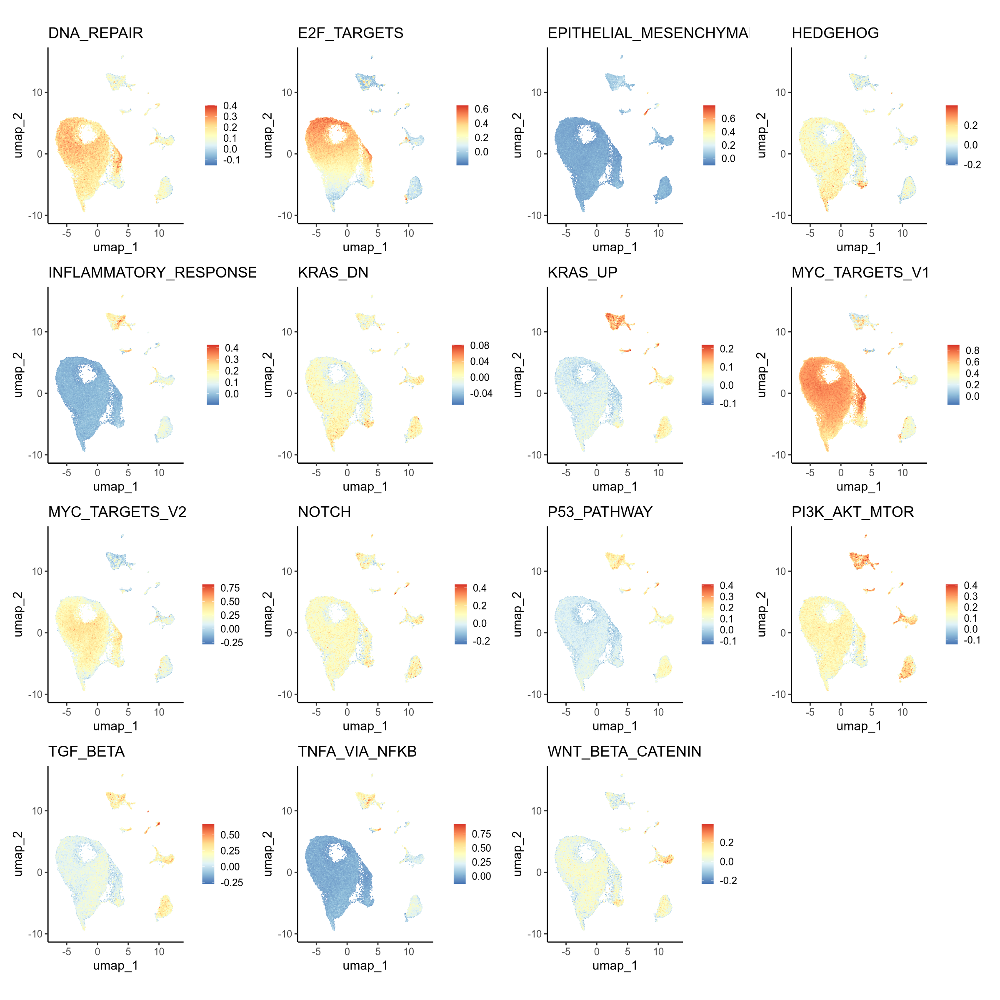

In [150]:
fig.size(20, 20)
FeaturePlot(dum, reduction = "umap", pt.size = 0.1,
                  features = names(inpGS), order = TRUE) &
  scale_color_distiller(palette = "RdYlBu") & plotTheme & coord_fixed()

In [124]:
dum <- AddModuleScore(dum, features = sig_list, name = names(sig_list))

Warning message:
“The following features are not present in the object: C19orf43, C1orf114, C20orf72, C7orf60, Cyp4v2, Diras3, Eif2c4, Fam134b, Fam82a2, Fam85a, Hmp19, Kiaa0226, Kiaa0895, Kif4a, Loc442075, Tp53inp1, Znf25, Znf317, Znf608, Linc00467, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Hspa6, Faslg, Ntf4, Pla2g2a, Prkacg, Tp53, Jmjd7-Pla2g4b, Fgf19, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Alox15b, H2aj, H1-2, H2ac25, Ifi30, Elp1, Irag2, Tp53, Tp63, Znf365, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Cxcl11, Cxcl6, Icoslg, Il4r, Cxcl8, not searching for symbol synonyms”


In [126]:
dum@meta.data %>% colnames

[1] "orig.ident"             "nCount_RNA"             "nFeature_RNA"          
 [4] "percent.mt"             "integrated_snn_res.0.5" "seurat_clusters"       
 [7] "integrated_snn_res.0.3" "annot"                  "adrn_score1"           
[10] "UMAP_1"                 "UMAP_2"                 "annot.rename"          
[13] "S.Score"                "G2M.Score"              "Phase"                 
[16] "old.ident"              "annot.new"              "HEDGEHOG"              
[19] "IL2_STAT5"              "IL6_JAK_STAT3"          "KRAS_DN"               
[22] "KRAS_UP"                "MTORC1"                 "NOTCH"                 
[25] "PI3K_AKT_MTOR"          "TGF_BETA"               "TNFA_VIA_NFKB"         
[28] "WNT_BETA_CATENIN"       "MYCN1"                  "MAPK2"                 
[31] "P533"                   "Inflammatory.Response4"

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


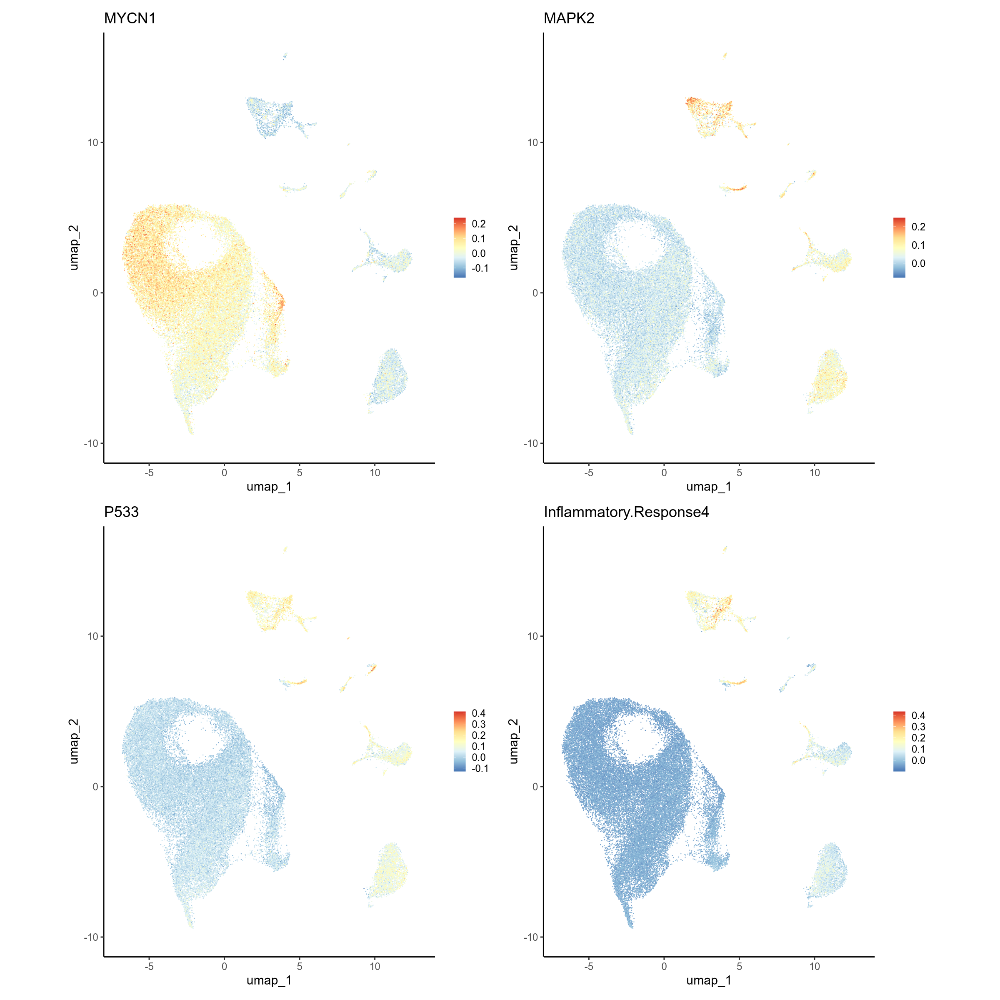

In [127]:
fig.size(20, 20)
FeaturePlot(dum, reduction = "umap", pt.size = 0.1,
                  features = c('MYCN1','MAPK2','P533','Inflammatory.Response4'), order = TRUE) &
  scale_color_distiller(palette = "RdYlBu") & plotTheme & coord_fixed()

In [215]:
genes = c('Dlk1', 'Fabp5', 'Fth1')

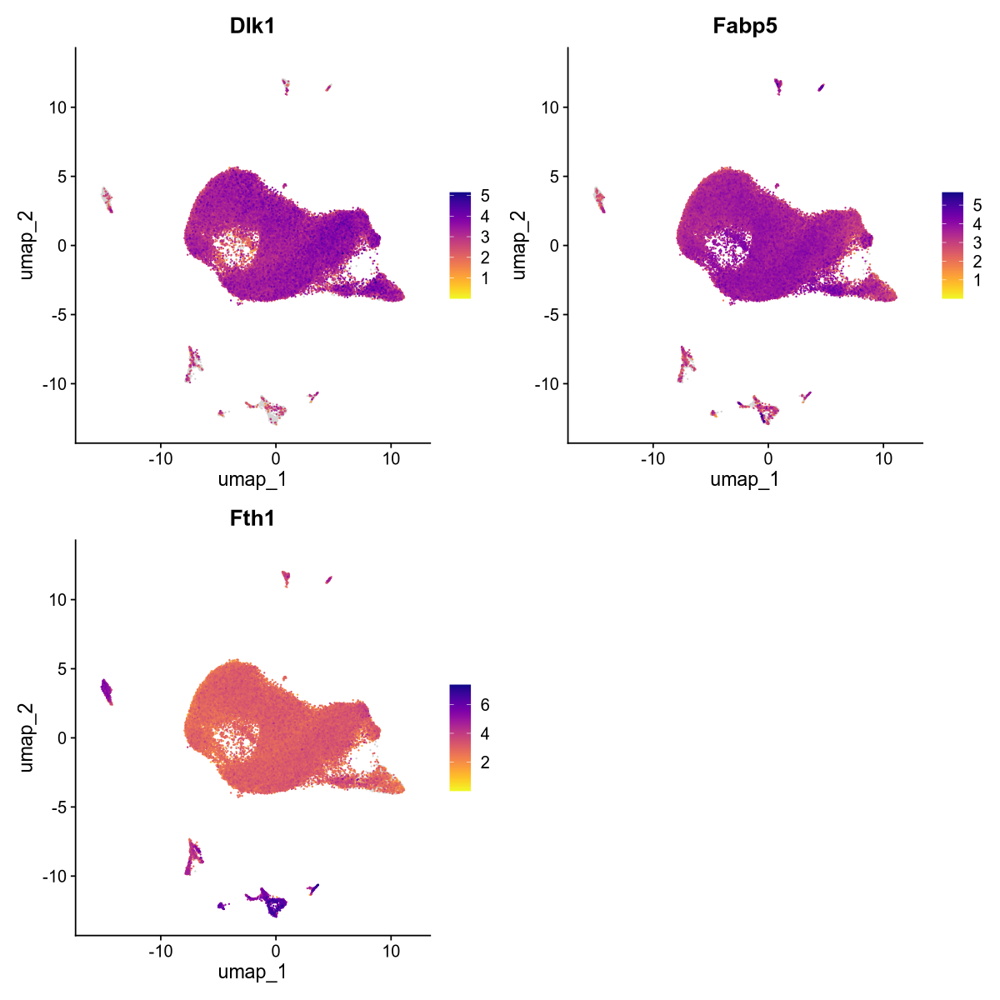

In [232]:
fig.size(10,10)
feat_hemi = FeaturePlot_scCustom(
    hemi, 
    reduction = "umap", 
    features = genes)
feat_hemi
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_3/Figure_R3E_signature_hemi.pdf'),
    plot =feat_hemi, 
    height = 10,
    width = 10,
    create.dir=TRUE
      )

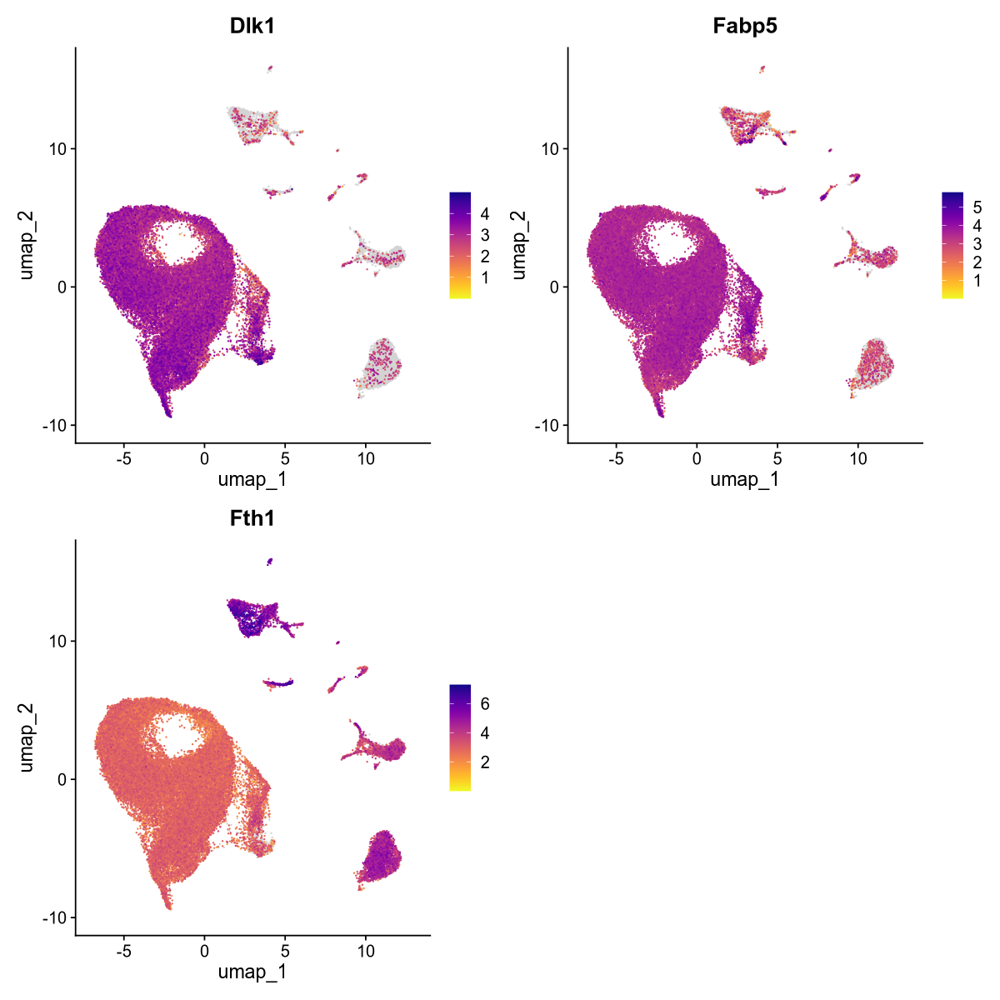

In [235]:
fig.size(10,10)
feat_hemi = FeaturePlot_scCustom(
    homo, 
    reduction = "umap", 
    features = genes)
feat_hemi
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_3/Figure_R3E_signature_homo.pdf'),
    plot =feat_hemi, 
    height = 10,
    width = 10,
    create.dir=TRUE
      )

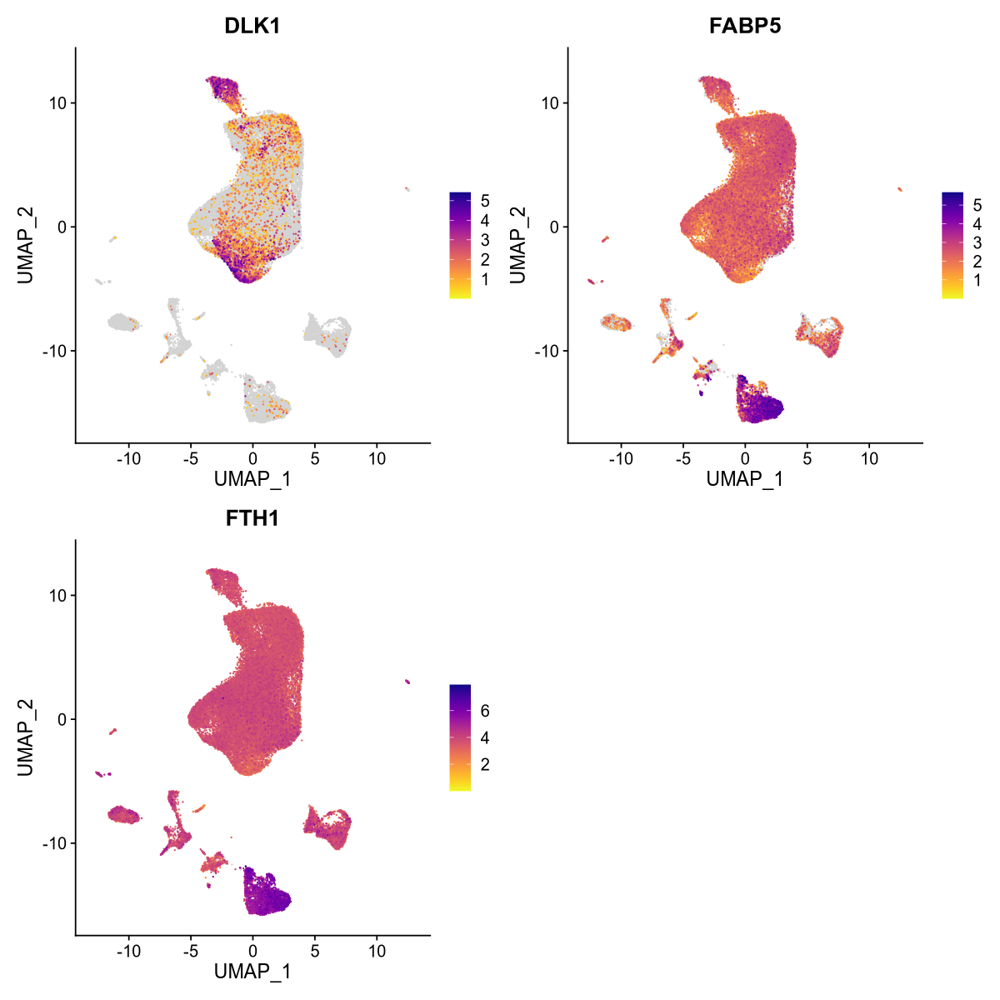

In [236]:
fig.size(10,10)
feat_hemi = FeaturePlot_scCustom(
    tumor.int, 
    reduction = "umap", 
    features = toupper(genes))
feat_hemi
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_3/Figure_R3E_signature_human.pdf'),
    plot =feat_hemi, 
    height = 10,
    width = 10,
    create.dir=TRUE
      )

In [242]:
human_gene_list <- c("JUN", "PEG10", "HIST1H1B", "MT1", "HSPB1", "STMN2", "HMGB2", 
                     "GABRG3", "CARTPT", "BEX2", "MEG3", "ZBTB8B", "TUBA1A", 
                     "H2AFZ", "TMSB4X", "TMSB10", "FTH1", "DLK1", "FABP5")


Warning message in DoHeatmap(tumor.int, slot = "data", features = human_gene_list, :
“The following features were omitted as they were not found in the data slot for the RNA assay: MT1”


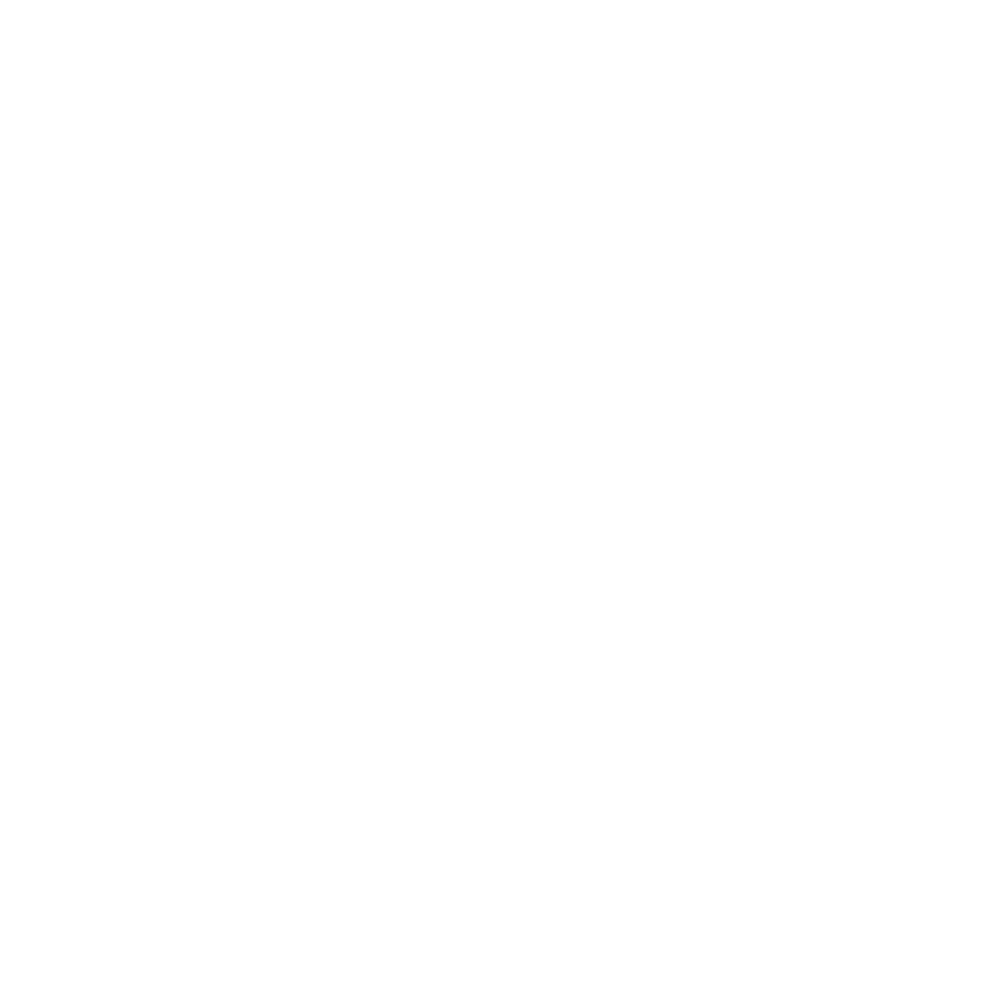

In [246]:
DoHeatmap(tumor.int, slot = "data", features = human_gene_list, group.by = "annot")

In [244]:
present_genes <- intersect(human_gene_list, rownames(tumor.int))
print(present_genes)

 [1] "JUN"      "PEG10"    "HIST1H1B" "HSPB1"    "STMN2"    "HMGB2"   
 [7] "GABRG3"   "CARTPT"   "BEX2"     "MEG3"     "ZBTB8B"   "TUBA1A"  
[13] "H2AFZ"    "TMSB4X"   "TMSB10"   "FTH1"     "DLK1"     "FABP5"   


In [248]:
average_expression <- AverageExpression(tumor.int, group.by = "annot", features = present_genes, assays = "RNA")

# Extract the RNA assay data (if needed)
average_expression_matrix <- average_expression$RNA


In [249]:
library(pheatmap)


Attaching package: ‘pheatmap’


The following object is masked from ‘package:ComplexHeatmap’:

    pheatmap




In [261]:
fig.size(10,10)
pheatmap(average_expression_matrix,
         cluster_rows = TRUE,  # Cluster genes
         cluster_cols = TRUE,  # Cluster cell types
         scale = "row",  # Scale the expression across genes
         color = colorRampPalette(rev(RColorBrewer::brewer.pal(n = 7, name = "RdBu")))(100),
         fontsize_row = 15,  # Adjust row font size
         fontsize_col = 15,  # Adjust column font size,
         filename =  glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/figures/2024/Figure_3/Figure_R3F_human_heatmap.pdf'),
         height = 10,
         width=10
         )


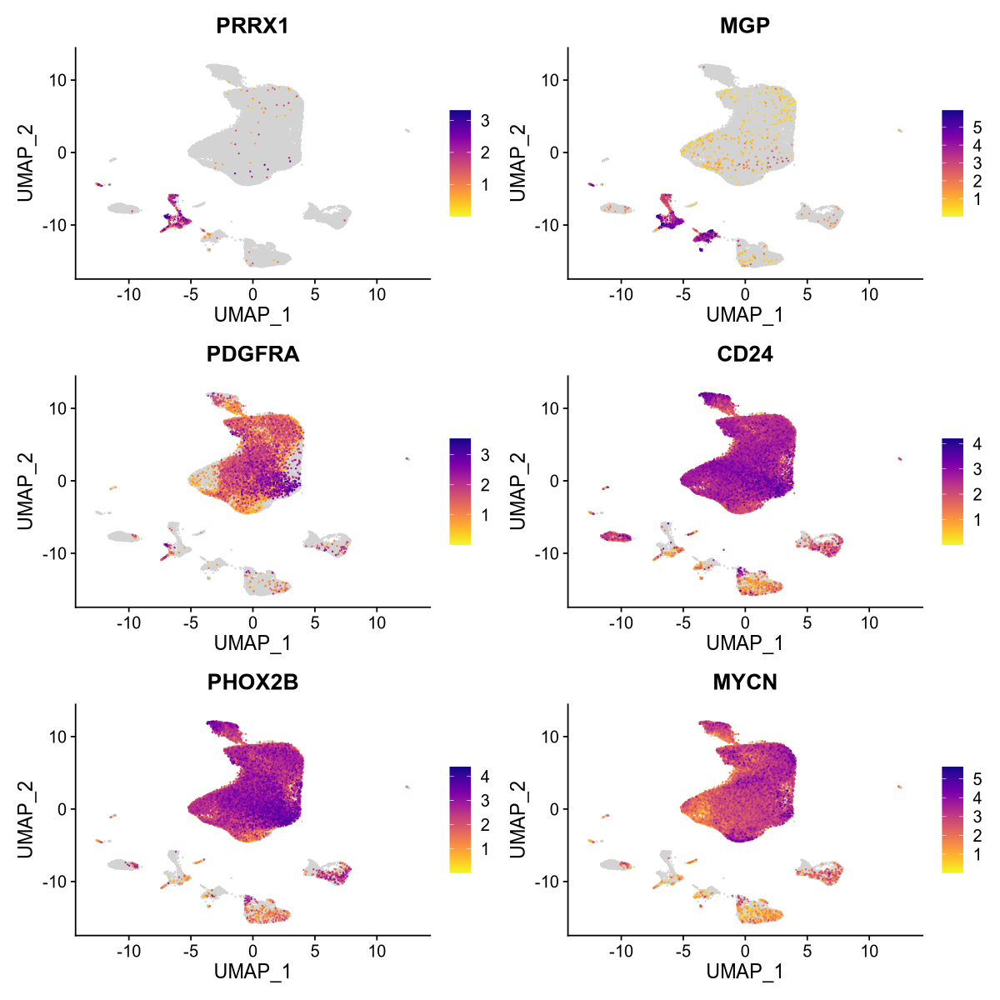

In [262]:
genes <- c("Prrx1", "Mgp", "Pdgfra", "Cd24", "Phox2b", "MYCN")
fig.size(10,10)
feat_hemi = FeaturePlot_scCustom(
    tumor.int, 
    reduction = "umap", 
    features = toupper(genes))
feat_hemi
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_3/Figure_R3G_featureplot_human.pdf'),
    plot =feat_hemi, 
    height = 10,
    width = 10,
    create.dir=TRUE
      )

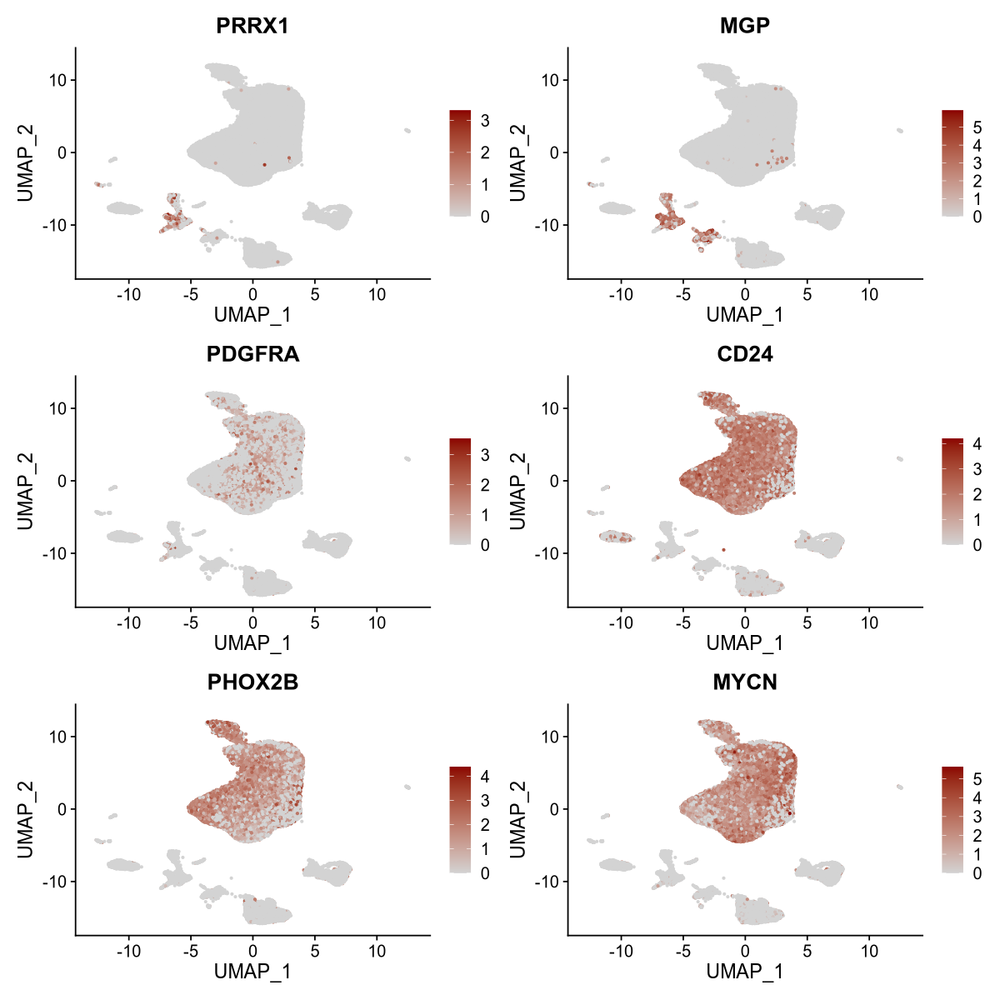

In [269]:
FeaturePlot(tumor.int, features = toupper(genes), reduction = "umap", ncol = 2, pt.size = 0.5, 
            cols = c("lightgrey", "darkred")) +
  theme(legend.position = "right")

In [270]:
print('Celltype proportion plots')

[1] "Celltype proportion plots"


In [276]:
fig.size(5,20)
p.hs = DimPlot(tumor.int, label = F, reduction = "umap", 
               group.by = "annot")+labs(title="resolution 0.5") +scale_color_manual(values = color.list) + NoAxes()
p.homo = DimPlot(homo, label=F, reduction="umap", group.by="annot.new")+scale_color_manual(values = color.list) + NoAxes()
p.hemi = DimPlot(hemi, label=F, reduction="umap", group.by="annot.new")+scale_color_manual(values = color.list) + NoAxes()
combined_plots.2 = p.hs | p.homo | p.hemi
combined_plots.2

ERROR: Error in value[[3L]](cond): could not open file '/tmp/Rtmpmeqy9z/file21372a658461d7.png'


plot without title

In [274]:
write.csv(tumor.int@meta.data,'human_homo_hemi_metadata/tumor_metadata.csv')
write.csv(homo@meta.data,'human_homo_hemi_metadata/homo_metadata.csv')
write.csv(hemi@meta.data,'human_homo_hemi_metadata/hemi_metadata.csv')

In [286]:
DimPlot(tumor.int)

ERROR: Error in value[[3L]](cond): could not open file '/tmp/Rtmpmeqy9z/file21372a10188364.png'


plot without title

In [287]:
saveRDS(
    tumor.int,
    '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/data/dong_et_al/20240901_6_sample_tumor_int.rds'
)